<a href="https://colab.research.google.com/github/OmriGruman/object-detection/blob/master/yolov3_sign_language.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Setup

Clone repo, install dependencies and check PyTorch and GPU.

In [1]:
!git clone https://github.com/ultralytics/yolov3  # clone
%cd yolov3
%pip install -qr requirements.txt  # install

import torch
from yolov3 import utils
display = utils.notebook_init()  # checks

YOLOv3 🚀 v9.6.0-46-gca9a981 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15102MiB)


Setup complete ✅ (2 CPUs, 12.7 GB RAM, 25.9/78.2 GB disk)


#Data

Download dataset

In [2]:
%cd /content

!mkdir datasets
!curl -L https://public.roboflow.com/ds/CUqysgecOO?key=yVfkNs9jpg > roboflow.zip
!unzip -q roboflow.zip -d datasets/sign-language
!rm roboflow.zip

/content
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   895  100   895    0     0   1896      0 --:--:-- --:--:-- --:--:--  1892
100 22.3M  100 22.3M    0     0  8573k      0  0:00:02  0:00:02 --:--:-- 15.9M


Read classes

In [3]:
%cd /content/datasets/sign-language/test

with open("_darknet.labels", 'r') as f:
    class_names = f.read().split('\n')
class_names

/content/datasets/sign-language/test


['A',
 'B',
 'C',
 'D',
 'E',
 'F',
 'G',
 'H',
 'I',
 'J',
 'K',
 'L',
 'M',
 'N',
 'O',
 'P',
 'Q',
 'R',
 'S',
 'T',
 'U',
 'V',
 'W',
 'X',
 'Y',
 'Z']

Prepare data

In [4]:
%cd /content/datasets/sign-language/

!mkdir images labels images/train images/valid images/test labels/train labels/valid labels/test
!mv train/*.jpg images/train
!mv valid/*.jpg images/valid
!mv test/*.jpg images/test
!mv train/*.txt labels/train
!mv valid/*.txt labels/valid
!mv test/*.txt labels/test
!rm -r train valid test

/content/datasets/sign-language


Construct yaml file for the data

In [5]:
%cd /content/yolov3/data

import yaml

data_dir_path = r"../datasets/sign-language"
train_path = r"images/train"
valid_path = r"images/valid"
test_path = r"images/valid"

yaml_content = {
    'path': data_dir_path,
    'train': train_path,
    'val': valid_path,
    'test': test_path,
    'names': {
        i: name for i, name in enumerate(class_names)
    }
}

with open("sign-language.yaml", 'w') as f:
    f.write(yaml.dump(yaml_content))

/content/yolov3/data


#Train

Train pretrained yolov3 model on custom data

In [6]:
%cd /content/yolov3

# Run YOLOv3 on custom data
!python train.py --weights yolov3.pt --data sign-language.yaml --freeze 11

/content/yolov3
train: weights=yolov3.pt, cfg=, data=sign-language.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[11], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
remote: Enumerating objects: 15257, done.
remote: Counting objects: 100% (21/21), done.
remote: Compressing objects: 100% (21/21), done.
remote: Total 15257 (delta 1), reused 2 (delta 0), pack-reused 15236
Receiving objects: 100% (15257/15257), 14.23 MiB | 18.14 MiB/s, done.
Resolving deltas: 100% (10455/10455), done.
From https://github.com/ultralytics/yolov5
 * [new branch]      add/w

#Visualize

Show results using Tensorboard

In [7]:
%load_ext tensorboard
%tensorboard --logdir runs/train

<IPython.core.display.Javascript object>

#Evaluation

Detect bounding boxes on test set

In [8]:
%cd /content/yolov3

!python detect.py --weights runs/train/exp/weights/best.pt --img 640 --conf 0.25 --source /content/datasets/sign-language/images/test

/content/yolov3
detect: weights=['runs/train/exp/weights/best.pt'], source=/content/datasets/sign-language/images/test, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv3 🚀 v9.6.0-46-gca9a9810 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 190 layers, 61632055 parameters, 0 gradients, 155.0 GFLOPs
image 1/72 /content/datasets/sign-language/images/test/A22_jpg.rf.f02ad8558ce1c88213b4f83c0bc66bc8.jpg: 640x640 1 A, 62.5ms
image 2/72 /content/datasets/sign-language/images/test/B14_jpg.rf.ed5ba6d44f55ab03e62d2baeac4aa1aa.jpg: 640x640 1 B, 62.5ms
image 3/72 /content/datasets/sign-language/images/test

/content/yolov3/runs/detect/exp


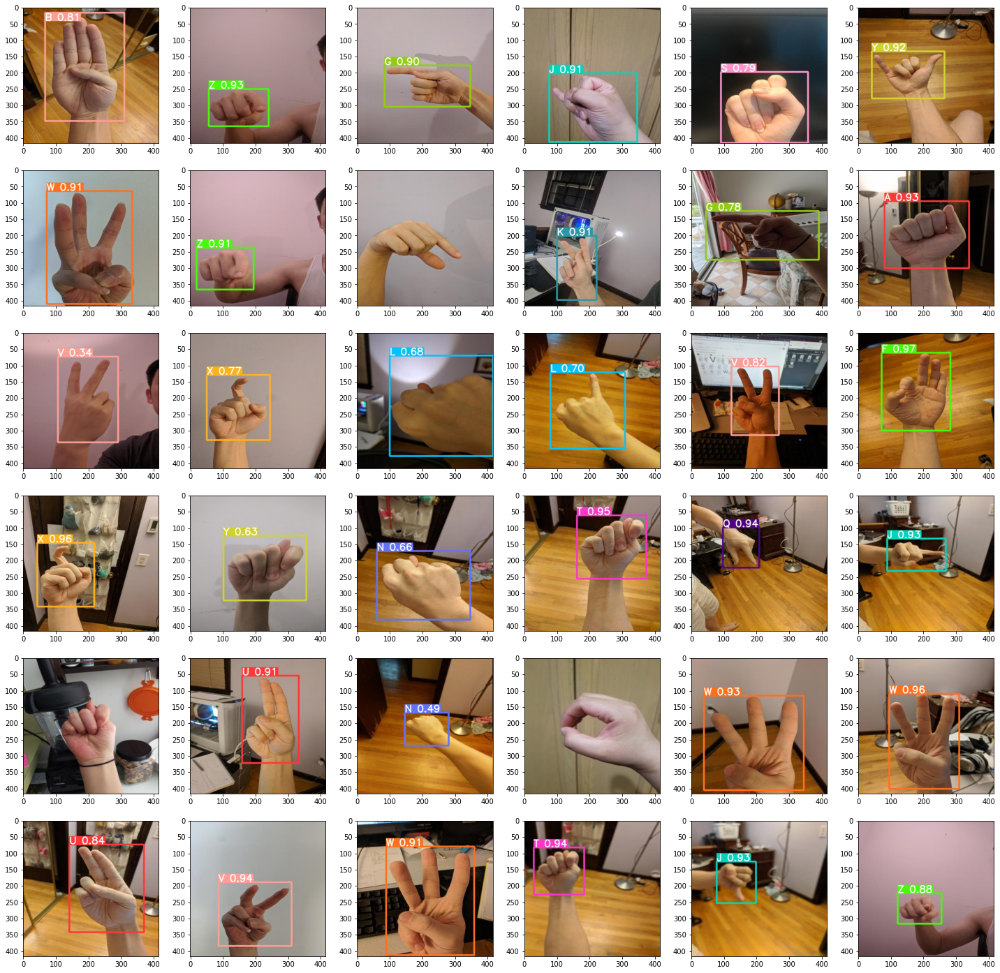

In [28]:
%cd /content/yolov3/runs/detect/exp/

from os import listdir
import matplotlib.pyplot as plt
from random import sample

SIZE = 6
_, axarr = plt.subplots(SIZE, SIZE, figsize=(25, 25))

images = iter(sample([plt.imread(image_name) for image_name in listdir()], SIZE ** 2))

for r in range(SIZE):
    for c in range(SIZE):
        axarr[r, c].imshow(next(images))

#Video

Try to detect sign language in video

In [30]:
%cd /content/yolov3

!python detect.py --weights runs/train/exp/weights/best.pt --img 640 --conf 0.25 --source 'https://www.youtube.com/watch?v=6_gXiBe9y9A'

/content/yolov3
detect: weights=['runs/train/exp/weights/best.pt'], source=https://www.youtube.com/watch?v=6_gXiBe9y9A, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv3 🚀 v9.6.0-46-gca9a9810 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 190 layers, 61632055 parameters, 0 gradients, 155.0 GFLOPs
WARNING ⚠️ Environment does not support cv2.imshow() or PIL Image.show()

requirements: YOLOv3 requirements "pafy" "youtube_dl==2020.12.2" not found, attempting AutoUpdate...
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━